In [1]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

seed = 10
np.random.seed(seed)

In [2]:
def run_cell_anova(adata, batch_key, condition_key, control_name, cell_type_label, dataset_name):
    if np.max(adata.X) > 15:
        sc.pp.filter_cells(adata, min_genes=300)
        sc.pp.filter_genes(adata, min_cells=10)

        sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
        sc.pp.log1p(adata)

    if adata.shape[1] > 3000:
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, batch_key=batch_key)
        adata = adata[:, adata.var["highly_variable"]].copy()
    else:
        sc.pp.highly_variable_genes(adata, n_top_genes=adata.shape[1], batch_key=batch_key)

    import warnings

    # Suppress all warnings
    warnings.filterwarnings("ignore")

    integrate_key = batch_key
    adata.obs['dataidx'] = adata.obs[batch_key].copy()
    #adata_prep = cnova.model.preprocess_data(adata, integrate_key='dataidx')

    batch = np.unique(adata.obs[integrate_key])
    list_batch = []
    for x in batch:
        adata_iter = adata[adata.obs[integrate_key] == x]
        list_batch.append(adata_iter)

    adata_prep = ad.concat(list_batch)
    adata_prep.layers['lognorm'] = adata_prep.X
    
    if adata.shape[1] > 3000:
        sc.pp.highly_variable_genes(adata_prep, n_top_genes=3000, batch_key=batch_key)
        adata_prep = adata_prep[:, adata.var["highly_variable"]].copy()
    else:
        sc.pp.highly_variable_genes(adata_prep, n_top_genes=adata.shape[1], batch_key=batch_key)
    
    sc.pp.scale(adata_prep)
    adata_prep.layers['scale'] = adata_prep.X

    control_batches = list(set(adata_prep[adata_prep.obs[condition_key] == control_name,].obs[batch_key]))
    control_dict = {
        'g1': control_batches,
    }
    adata_prep = cnova.model.calc_ME(adata_prep, integrate_key='dataidx')
    adata_prep = cnova.model.calc_BE(adata_prep, integrate_key, control_dict)
    adata_prep = cnova.model.calc_TE(adata_prep, integrate_key)
    print(control_dict)
    adata_prep.obs['PseudoState'] = adata_prep.obs[condition_key].copy()
    adata_prep.write_h5ad("./cellanova/" + dataset_name + "_results.h5ad")

    integrated = ad.AnnData(adata_prep.layers['denoised'], dtype=np.float32)
    integrated.obs = adata_prep.obs.copy()
    integrated.var_names = adata_prep.var_names

    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15, n_pcs=30)
    sc.tl.umap(integrated)
    if cell_type_label is not None:
        sc.pl.umap(integrated, color=['dataidx', cell_type_label])
    else:
        sc.pl.umap(integrated, color='dataidx')

    res = cnova.utils.calc_oobNN(integrated, batch_key='dataidx', condition_key='PseudoState')
    df = res.obsm['knn_prop']
    df['condition'] = res.obs['PseudoState']
    df = df.reset_index()
    df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
    df = df.rename(columns={'index': 'obs_name'})
    df.to_csv("./cellanova/" + dataset_name + "_oobNN.csv")

    g = sea.FacetGrid(df, col='neighbor', hue='condition')
    g.map(sea.kdeplot, 'proportion', bw_adjust=2, alpha=1)
    g.set(xlabel='NN proportion', ylabel='Density')
    g.add_legend()
    plt.suptitle('CellANOVA integration')
    sea.set_style('white')
    plt.show()

# Human kidney multiomics atlas

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE211785

2025-01-12 11:11:41,619 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


2025-01-12 11:12:05,839 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-01-12 11:12:06,945 - harmonypy - INFO - Iteration 1 of 30


2025-01-12 11:13:53,002 - harmonypy - INFO - Iteration 2 of 30


2025-01-12 11:15:38,195 - harmonypy - INFO - Converged after 2 iterations


{'g1': ['SN_RNA', 'SC_RNA']}


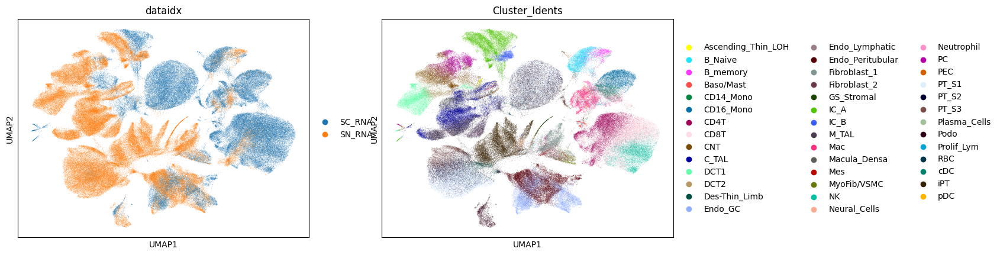

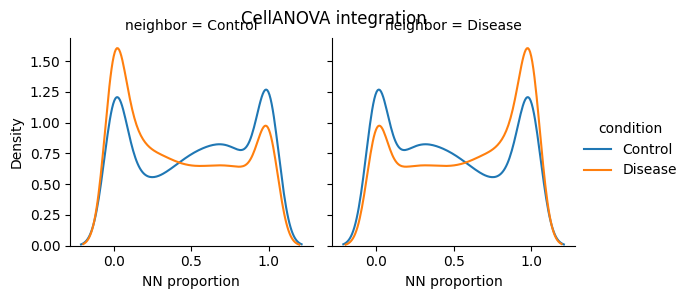

In [3]:
adata=sc.read_h5ad("../case_control/data/GSE211785_Susztak_SC_SN_ATAC_merged_PreSCVI_final.h5ad")
adata=adata[adata.obs["tech"].isin(['SC_RNA','SN_RNA'])].copy()
run_cell_anova(adata=adata, batch_key="tech", condition_key="Status", control_name='Control', cell_type_label='Cluster_Idents', dataset_name="kidney_tech")

In [4]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

from metrics import calculate_metrics

R_HOME is already set to: /vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R


Unable to determine R library path: Command '('/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 127.


/gpfs/gibbs/project/wang_zuoheng/xx244/Ndreamer/case_control_benchmark/metrics.py:29: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:241: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '


In [5]:
def calculate_mean_proportion_matrix(df):
    """
    Calculates the mean proportion for each combination of condition and neighbor
    and summarizes the result in a square matrix dataframe.

    Parameters:
    df (pd.DataFrame): Input dataframe with columns ['condition', 'neighbor', 'proportion'].

    Returns:
    pd.DataFrame: A square matrix dataframe where rows represent 'condition' and columns represent 'neighbor'.
    """
    # Use a pivot table to calculate the mean proportions
    mean_matrix = df.pivot_table(
        index='condition',
        columns='neighbor',
        values='proportion',
        aggfunc='mean',
        fill_value=0  # Replace NaN with 0 if there are missing combinations
    )

    return mean_matrix

def calculate_rowwise_correlation(adata1, adata2, batch_key="batch_all_with_condition"):
    # Ensure the obs index and batch_key match
    #assert np.sum(adata1.obs["batch_all_with_condition"]!=adata2.obs["batch_all_with_condition"])==0, "obs indices do not match between the two AnnData objects"
    assert batch_key in adata1.obs.columns, f"{batch_key} not found in adata1.obs"
    assert batch_key in adata2.obs.columns, f"{batch_key} not found in adata2.obs"

    results = []

    # Iterate through unique batches
    unique_batches = adata1.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the data for the current batch
        batch_mask = adata1.obs[batch_key] == batch
        data1 = adata1[batch_mask].X
        data2 = adata2[batch_mask].X
        
        barcodes=adata1[batch_mask].obs_names.tolist()

        # Ensure the data is in dense format if sparse
        if not isinstance(data1, np.ndarray):
            data1 = data1.toarray()
        if not isinstance(data2, np.ndarray):
            data2 = data2.toarray()

        # Compute correlation for each row
        for i in range(data1.shape[0]):
            row_corr = np.corrcoef(data1[i, :], data2[i, :])[0, 1]
            mse=np.mean(np.square(data1[i, :]-data2[i, :]))
            results.append({"correlation": row_corr, batch_key: batch, "barcode":barcodes[i], "mse":mse})

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)
    return result_df


def extract_de_results(adata, batch_key, cell_type_key, key_added="DE_wilcoxon", min_cells=30):
    results = []

    # Iterate through unique batches
    unique_batches = adata.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the AnnData for the current batch
        adata_batch = adata[adata.obs[batch_key] == batch]
        
        # Filter out cell types with fewer than `min_cells` cells
        cell_counts = adata_batch.obs[cell_type_key].value_counts()
        valid_cell_types = cell_counts[cell_counts >= min_cells].index
        
        # Subset the AnnData object to only include valid cell types
        adata_batch = adata_batch[adata_batch.obs[cell_type_key].isin(valid_cell_types)]
        
        # Skip the batch if there are no valid cell types
        if adata_batch.shape[0] == 0 or len(valid_cell_types) == 0:
            continue
        
        # Perform DE analysis
        sc.tl.rank_genes_groups(adata_batch, groupby=cell_type_key, method='wilcoxon', key_added=key_added, use_raw=False)
        
        # Extract DE results for each valid cell type
        for cell_type in valid_cell_types:
            # Extract adjusted p-values and gene names
            gene_names = adata_batch.uns[key_added]['names'][cell_type]
            pvals_adj = adata_batch.uns[key_added]['pvals_adj'][cell_type]
            
            # Create a dictionary for the current cell type and batch
            row_data = {
                "cell_type_key": cell_type,
                "batch_all_with_condition": batch,
            }
            # Add adjusted p-values for each gene as separate columns
            row_data.update({gene: pval for gene, pval in zip(gene_names, pvals_adj)})
            results.append(row_data)
    
    # Convert results to a DataFrame
    result_df = pd.DataFrame(results)
    return result_df

def evaluate_cellanova(adata, cell_type_key, batch_key, condition_key, dataset_name):
    adata.raw=None
    print("adata preprocessing...")

    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    if isinstance(batch_key, str):
       batch_key = [batch_key]

    batch_all = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all.append(tmp)
    batch_all = np.array(batch_all)
    adata.obs["batch_all"]=batch_all
    adata.obs["batch_all"] = adata.obs["batch_all"].astype("category")
    print("batch_all", np.unique(batch_all))

    batch_all_with_condition = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + adata.obs[condition_key][i]
        batch_all_with_condition.append(tmp)
    batch_all_with_condition = np.array(batch_all_with_condition)
    adata.obs["batch_all_with_condition"] = batch_all_with_condition
    adata.obs["batch_all_with_condition"] = adata.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition", np.unique(batch_all_with_condition))

    batch_key.append("batch_all")
    batch_key.append("batch_all_with_condition")
    print("Finish preprocessing")

    main_effect_adata = ad.AnnData(adata.layers['main_effect'], dtype=np.float32)
    main_effect_adata.var_names = adata.var_names
    main_effect_adata.obs = adata.obs.copy()

    integrated = ad.AnnData(adata.layers['denoised'], dtype=np.float32)
    integrated.obs = adata.obs.copy()
    integrated.var_names = adata.var_names

    print("Calculating global distortion...")
    df_global_correlation=calculate_rowwise_correlation(adata, integrated)
    df_global_correlation.to_csv("./cellanova/"+dataset_name+"_global_correlation.csv")
    print("Finish")

    print("Evaluate gene-level signal distortion")
    if True:#dataset_name!="mouse":
        real_data_DE = extract_de_results(adata=adata, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        denoised_DE = extract_de_results(adata=integrated, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        real_data_DE.to_csv("./cellanova/"+dataset_name+"_real_DE.csv")
        denoised_DE.to_csv("./cellanova/"+dataset_name+"_denoised_DE.csv")
    print("Finish")

    print("Plot of main effect:")
    if main_effect_adata.shape[1] > 60:
        sc.pp.pca(main_effect_adata)
    sc.pp.neighbors(main_effect_adata, n_neighbors=15)
    sc.tl.umap(main_effect_adata)
    sc.pl.umap(main_effect_adata, color=[cell_type_key, condition_key] + batch_key, ncols=1)

    print("Plot of denoised expression")
    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15)
    sc.tl.umap(integrated)
    sc.pl.umap(integrated, color=[cell_type_key, condition_key] + batch_key, ncols=1)
    print("Finish adata preprocessing","="*20)
    
    print("Batch-related mixing performance evaluation for main effect:")
    for batch_keyi in batch_key:
        print("Batch-related mixing performance evaluation for main effect:")
        print(batch_keyi)
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(main_effect_adata, batch_key=batch_keyi,
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("=" * 20)

    print("Batch effect:")
    print("condition-related mixing performance evaluation for main effect:")
    import rpy2.robjects as robjects
    import anndata2ri
    anndata2ri.activate()
    # Add your library path
    library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
    # Update R's library paths
    robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
    # Verify the updated library paths
    print(robjects.r('.libPaths()'))
    calculate_metrics(main_effect_adata, batch_key=condition_key,
                      celltype_key=cell_type_key, all=True, n_neighbors=15)
    print("="*20)

    print("Within each unique condition, evaluate the batch effect of the denoised data")
    unique_conditions=np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Within each unique condition, evaluate the batch effect of the main effect")
        print("Now evaluating",conditioni)
        integratedi=integrated[integrated.obs[condition_key]==conditioni].copy()
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(integratedi, batch_key="batch_all",
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("*"*20)
    
    res = cnova.utils.calc_oobNN(integrated, batch_key="batch_all_with_condition", condition_key=condition_key)
    df = res.obsm['knn_prop']
    df['condition'] = res.obs[condition_key]
    df.index.name = "index"

    df = df.reset_index()
    df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
    df = df.rename(columns={'index': 'obs_name'})
    df.to_csv("./cellanova/" + dataset_name + "_oobNN.csv")

    g = sea.FacetGrid(df, col='neighbor', hue='condition')
    g.map(sea.kdeplot, 'proportion', bw_adjust=2, alpha=1)
    g.set(xlabel='NN proportion', ylabel='Density')
    g.add_legend()
    plt.suptitle('CellANOVA integration')
    sea.set_style('white')
    plt.show()

    df_summarize=calculate_mean_proportion_matrix(df)
    print(df_summarize)
    df_summarize.to_csv("./cellanova/"+dataset_name+"_summary.csv",index=False)

adata preprocessing...


batch_all ['HK1584__SC_RNA' 'HK1585__SC_RNA' 'HK1588__SC_RNA' 'HK1593__SC_RNA'
 'HK1594__SC_RNA' 'HK1597__SC_RNA' 'HK1632__SC_RNA' 'HK1634__SC_RNA'
 'HK1635__SC_RNA' 'HK1650__SC_RNA' 'HK1664__SC_RNA' 'HK1770__SC_RNA'
 'HK1997__SC_RNA' 'HK2558__SN_RNA' 'HK2596__SN_RNA' 'HK2662__SC_RNA'
 'HK2663__SN_RNA' 'HK2711__SN_RNA' 'HK2713__SC_RNA' 'HK2739__SN_RNA'
 'HK2770__SC_RNA' 'HK2770__SN_RNA' 'HK2774__SC_RNA' 'HK2774__SN_RNA'
 'HK2833__SC_RNA' 'HK2833__SN_RNA' 'HK2844__SN_RNA' 'HK2862__SN_RNA'
 'HK2867__SC_RNA' 'HK2867__SN_RNA' 'HK2868__SN_RNA' 'HK2891__SC_RNA'
 'HK2891__SN_RNA' 'HK2893__SC_RNA' 'HK2893__SN_RNA' 'HK2895__SC_RNA'
 'HK2895__SN_RNA' 'HK2896__SC_RNA' 'HK2898__SN_RNA' 'HK2899__SC_RNA'
 'HK2899__SN_RNA' 'HK2923__SC_RNA' 'HK2924__SC_RNA' 'HK2976__SN_RNA']


batch_all_with_condition ['HK1584__SC_RNA__Disease' 'HK1585__SC_RNA__Control'
 'HK1588__SC_RNA__Control' 'HK1593__SC_RNA__Disease'
 'HK1594__SC_RNA__Disease' 'HK1597__SC_RNA__Disease'
 'HK1632__SC_RNA__Disease' 'HK1634__SC_RNA__Disease'
 'HK1635__SC_RNA__Disease' 'HK1650__SC_RNA__Disease'
 'HK1664__SC_RNA__Control' 'HK1770__SC_RNA__Disease'
 'HK1997__SC_RNA__Control' 'HK2558__SN_RNA__Disease'
 'HK2596__SN_RNA__Disease' 'HK2662__SC_RNA__Control'
 'HK2663__SN_RNA__Disease' 'HK2711__SN_RNA__Disease'
 'HK2713__SC_RNA__Control' 'HK2739__SN_RNA__Disease'
 'HK2770__SC_RNA__Disease' 'HK2770__SN_RNA__Control'
 'HK2774__SC_RNA__Disease' 'HK2774__SN_RNA__Disease'
 'HK2833__SC_RNA__Control' 'HK2833__SN_RNA__Control'
 'HK2844__SN_RNA__Disease' 'HK2862__SN_RNA__Disease'
 'HK2867__SC_RNA__Control' 'HK2867__SN_RNA__Control'
 'HK2868__SN_RNA__Disease' 'HK2891__SC_RNA__Control'
 'HK2891__SN_RNA__Control' 'HK2893__SC_RNA__Control'
 'HK2893__SN_RNA__Control' 'HK2895__SC_RNA__Control'
 'HK2895__SN_RNA__Con

Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


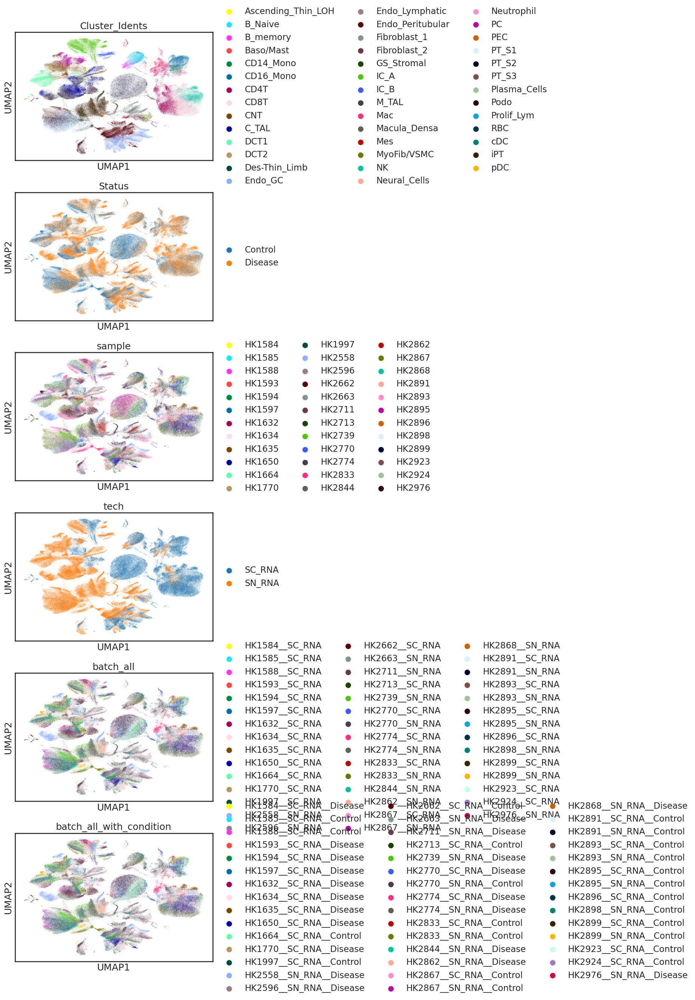

Plot of denoised expression


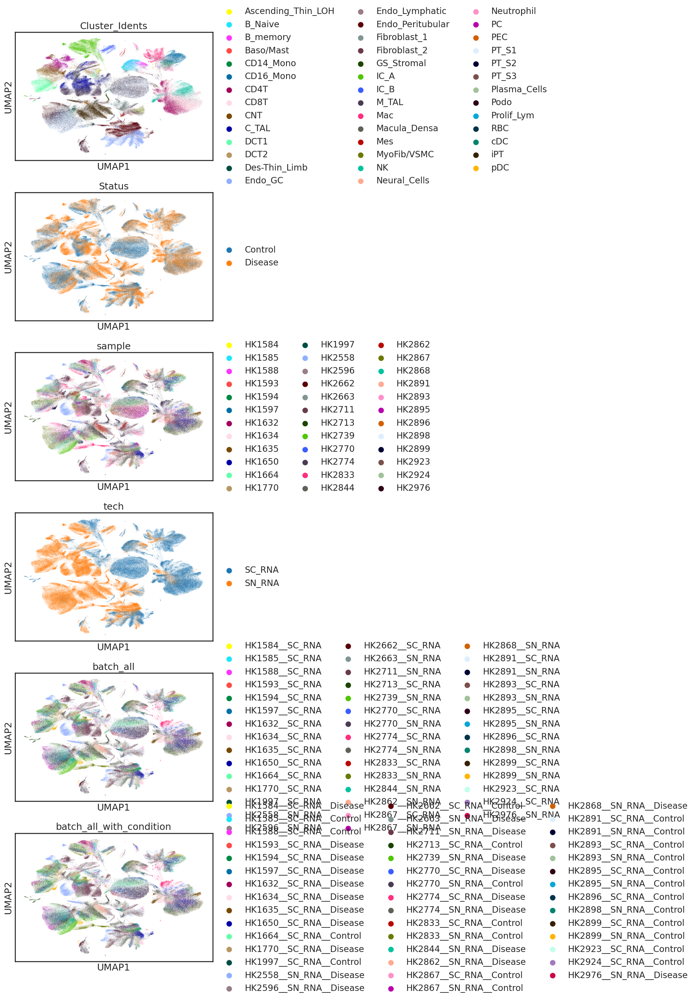

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
sample
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9888547936725474 0.03667727670917595 0.07073109060201942


ASW---


asw_label 0.5313772447407246


asw_batch 0.8469046071298523


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.6054977333480684


graph_conn 0.9187104508040086


NMI, ARI ---


NMI 0.7121768127740384
ARI 0.4763092344876053
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.531377  0.476309  0.712177  0.988855  0.036677   0.846905   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.605498             0.91871        0.0  0.794098   

       true pos rate   F1 LISI  
X_pca       0.001723  0.070731  
Batch-related mixing performance evaluation for main effect:
tech
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


Cell cluster Baso/Mast contains only one batch or has less than 10 cells. Skip.


LISI---


cLISI, bLISI, LISI_F1 0.9888547936725474 0.05848850268123341 0.11044446735357866


ASW---


asw_label 0.5313772447407246


asw_batch 0.7370844575368146


kBET---


1 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.3132338441657503


graph_conn 0.9187104508040086


NMI, ARI ---


NMI 0.7121768127740384
ARI 0.4763092344876053
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.531377  0.476309  0.712177  0.988855  0.058489   0.737084   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.313234             0.91871        0.0  0.794098   

       true pos rate   F1 LISI  
X_pca       0.321549  0.110444  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9888547936725474 0.030479612121452 0.05913645293293233


ASW---


asw_label 0.5313772447407246


asw_batch 0.8570939758010141


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.6145941125979681


graph_conn 0.9187104508040086


NMI, ARI ---


NMI 0.7121768127740384
ARI 0.4763092344876053
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI    bLISI  ASW_batch  \
X_pca   0.531377  0.476309  0.712177  0.988855  0.03048   0.857094   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.614594             0.91871        0.0  0.794098   

       true pos rate   F1 LISI  
X_pca       0.001691  0.059136  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9888547936725474 0.030479612121452 0.05913645293293233


ASW---


asw_label 0.5313772447407246


asw_batch 0.8570939758010141


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.6156033850810064


graph_conn 0.9187104508040086


NMI, ARI ---


NMI 0.7121768127740384
ARI 0.4763092344876053
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI    bLISI  ASW_batch  \
X_pca   0.531377  0.476309  0.712177  0.988855  0.03048   0.857094   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.615603             0.91871        0.0  0.794098   

       true pos rate   F1 LISI  
X_pca       0.001691  0.059136  
Batch effect:
condition-related mixing performance evaluation for main effect:
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9888547936725474 0.3375249676252966 0.5032694134202761


ASW---


asw_label 0.5313772447407246


asw_batch 0.8811796691054306


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


kbet_score 0.6430606329737134


graph_conn 0.9187104508040086


NMI, ARI ---


NMI 0.7121768127740384
ARI 0.4763092344876053
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.531377  0.476309  0.712177  0.988855  0.337525    0.88118   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.643061             0.91871        0.0  0.794098   

       true pos rate   F1 LISI  
X_pca       0.213839  0.503269  
Within each unique condition, evaluate the batch effect of the denoised data
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating Control


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9874857968634165 0.04299990432887078 0.08241122558443405


ASW---


asw_label 0.5352574847638607


asw_batch 0.8628368752690642


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


kbet_score 0.5792126143841414


graph_conn 0.869583578933187


NMI, ARI ---
NMI 0.692451932484581
ARI 0.42812468200343134
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI  bLISI  ASW_batch  \
X_pca   0.535257  0.428125  0.692452  0.987486  0.043   0.862837   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.579213            0.869584        0.0   0.77429   

       true pos rate   F1 LISI  
X_pca       0.023603  0.082411  
********************
Within each unique condition, evaluate the batch effect of the main effect
Now evaluating Disease


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.989779342603608 0.03303219839539293 0.06393081482168357


ASW---


asw_label 0.5326578058302402


asw_batch 0.856198795865897


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


kbet_score 0.5290002963405999


graph_conn 0.9101901641926258


NMI, ARI ---


NMI 0.7076804485426956
ARI 0.5086651072267155
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.532658  0.508665  0.70768  0.989779  0.033032   0.856199   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca             0.529             0.91019        0.0   0.80712   

       true pos rate   F1 LISI  
X_pca       0.002327  0.063931  
********************


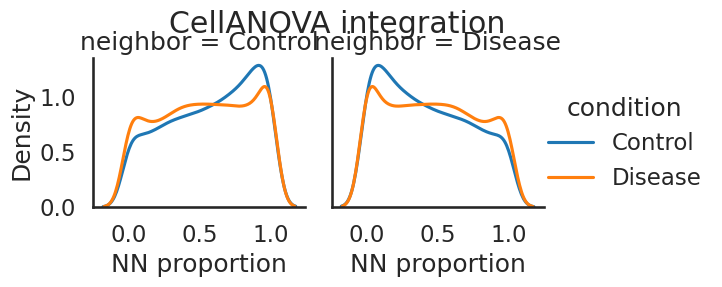

neighbor    Control   Disease
condition                    
Control    0.572567  0.427433
Disease    0.533391  0.466609


In [6]:
adata=sc.read_h5ad("./cellanova/kidney_tech_results.h5ad")
evaluate_cellanova(adata=adata,cell_type_key='Cluster_Idents',batch_key=['sample','tech'],
                   condition_key="Status",dataset_name="kidney_tech")

In [7]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

from metrics import calculate_metrics

In [8]:
def plot_cellanova(adata, cell_type_key, batch_key, condition_key, dataset_name):
    adata.raw = None
    print("adata preprocessing...",dataset_name)

    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    if isinstance(batch_key, str):
        batch_key = [batch_key]

    batch_all = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all.append(tmp)
    batch_all = np.array(batch_all)
    adata.obs["batch_all"] = batch_all
    adata.obs["batch_all"] = adata.obs["batch_all"].astype("category")
    print("batch_all", np.unique(batch_all),dataset_name)

    batch_all_with_condition = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + adata.obs[condition_key][i]
        batch_all_with_condition.append(tmp)
    batch_all_with_condition = np.array(batch_all_with_condition)
    adata.obs["batch_all_with_condition"] = batch_all_with_condition
    adata.obs["batch_all_with_condition"] = adata.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition", np.unique(batch_all_with_condition))

    batch_key.append("batch_all")
    batch_key.append("batch_all_with_condition")

    main_effect_adata = ad.AnnData(adata.layers['main_effect'], dtype=np.float32)
    main_effect_adata.var_names = adata.var_names
    main_effect_adata.obs = adata.obs.copy()

    integrated = ad.AnnData(adata.layers['denoised'], dtype=np.float32)
    integrated.obs = adata.obs.copy()
    integrated.var_names = adata.var_names

    print("Plot of main effect:",dataset_name)
    if main_effect_adata.shape[1] > 60:
        sc.pp.pca(main_effect_adata)
    sc.pp.neighbors(main_effect_adata, n_neighbors=15)
    sc.tl.umap(main_effect_adata)
    sc.pl.umap(main_effect_adata, color=[cell_type_key, condition_key] + batch_key, ncols=1)

    print("Plot of denoised expression",dataset_name)
    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15)
    sc.tl.umap(integrated)
    sc.pl.umap(integrated, color=[cell_type_key, condition_key] + batch_key, ncols=1)

    print("Within each unique condition, plot main effect",dataset_name)
    unique_conditions = np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Now evaluating", conditioni, "main effect")
        main_effect_adatai = main_effect_adata[main_effect_adata.obs[condition_key] == conditioni]
        sc.pl.umap(main_effect_adatai, color=[cell_type_key] + batch_key, ncols=1)
        print("-" * 20)

    print("Within each unique condition, plot denoised expression",dataset_name)
    unique_conditions = np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Now evaluating", conditioni, "denoised expression")
        integratedi = integrated[integrated.obs[condition_key] == conditioni]
        sc.pl.umap(integratedi, color=[cell_type_key] + batch_key, ncols=1)
        print("-" * 20)

adata preprocessing... kidney_tech


batch_all ['HK1584__SC_RNA' 'HK1585__SC_RNA' 'HK1588__SC_RNA' 'HK1593__SC_RNA'
 'HK1594__SC_RNA' 'HK1597__SC_RNA' 'HK1632__SC_RNA' 'HK1634__SC_RNA'
 'HK1635__SC_RNA' 'HK1650__SC_RNA' 'HK1664__SC_RNA' 'HK1770__SC_RNA'
 'HK1997__SC_RNA' 'HK2558__SN_RNA' 'HK2596__SN_RNA' 'HK2662__SC_RNA'
 'HK2663__SN_RNA' 'HK2711__SN_RNA' 'HK2713__SC_RNA' 'HK2739__SN_RNA'
 'HK2770__SC_RNA' 'HK2770__SN_RNA' 'HK2774__SC_RNA' 'HK2774__SN_RNA'
 'HK2833__SC_RNA' 'HK2833__SN_RNA' 'HK2844__SN_RNA' 'HK2862__SN_RNA'
 'HK2867__SC_RNA' 'HK2867__SN_RNA' 'HK2868__SN_RNA' 'HK2891__SC_RNA'
 'HK2891__SN_RNA' 'HK2893__SC_RNA' 'HK2893__SN_RNA' 'HK2895__SC_RNA'
 'HK2895__SN_RNA' 'HK2896__SC_RNA' 'HK2898__SN_RNA' 'HK2899__SC_RNA'
 'HK2899__SN_RNA' 'HK2923__SC_RNA' 'HK2924__SC_RNA' 'HK2976__SN_RNA'] kidney_tech


batch_all_with_condition ['HK1584__SC_RNA__Disease' 'HK1585__SC_RNA__Control'
 'HK1588__SC_RNA__Control' 'HK1593__SC_RNA__Disease'
 'HK1594__SC_RNA__Disease' 'HK1597__SC_RNA__Disease'
 'HK1632__SC_RNA__Disease' 'HK1634__SC_RNA__Disease'
 'HK1635__SC_RNA__Disease' 'HK1650__SC_RNA__Disease'
 'HK1664__SC_RNA__Control' 'HK1770__SC_RNA__Disease'
 'HK1997__SC_RNA__Control' 'HK2558__SN_RNA__Disease'
 'HK2596__SN_RNA__Disease' 'HK2662__SC_RNA__Control'
 'HK2663__SN_RNA__Disease' 'HK2711__SN_RNA__Disease'
 'HK2713__SC_RNA__Control' 'HK2739__SN_RNA__Disease'
 'HK2770__SC_RNA__Disease' 'HK2770__SN_RNA__Control'
 'HK2774__SC_RNA__Disease' 'HK2774__SN_RNA__Disease'
 'HK2833__SC_RNA__Control' 'HK2833__SN_RNA__Control'
 'HK2844__SN_RNA__Disease' 'HK2862__SN_RNA__Disease'
 'HK2867__SC_RNA__Control' 'HK2867__SN_RNA__Control'
 'HK2868__SN_RNA__Disease' 'HK2891__SC_RNA__Control'
 'HK2891__SN_RNA__Control' 'HK2893__SC_RNA__Control'
 'HK2893__SN_RNA__Control' 'HK2895__SC_RNA__Control'
 'HK2895__SN_RNA__Con

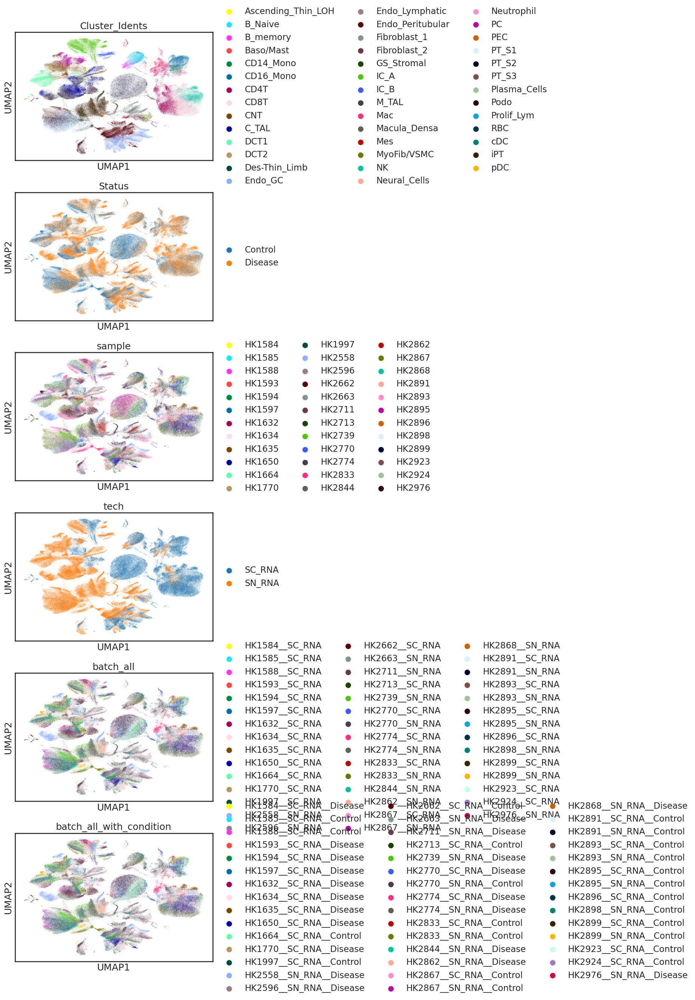

Plot of denoised expression kidney_tech


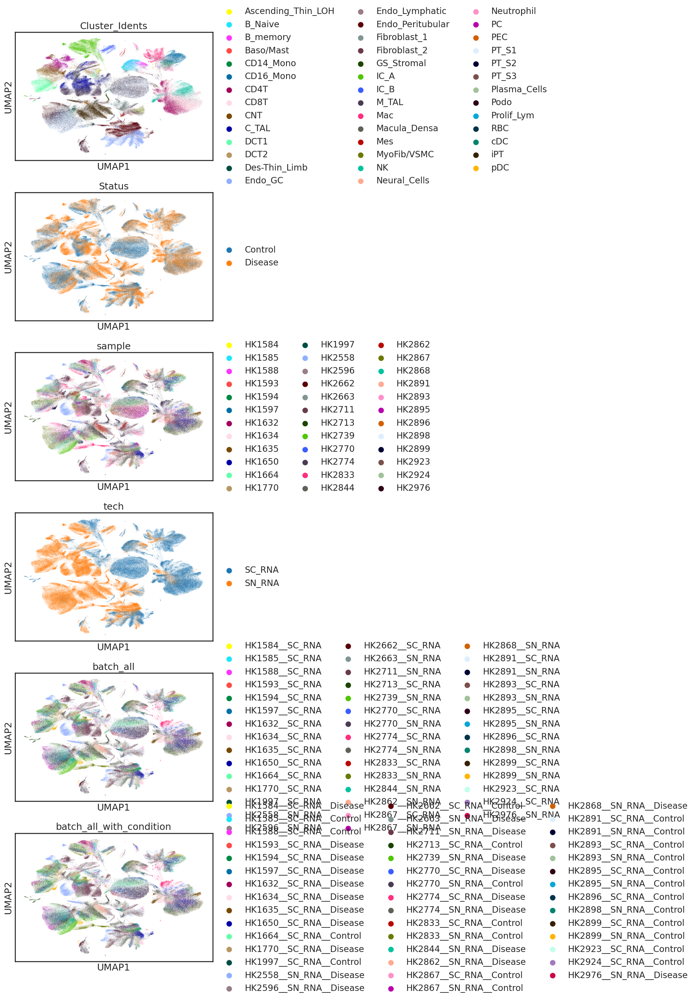

Within each unique condition, plot main effect kidney_tech
Now evaluating Control main effect


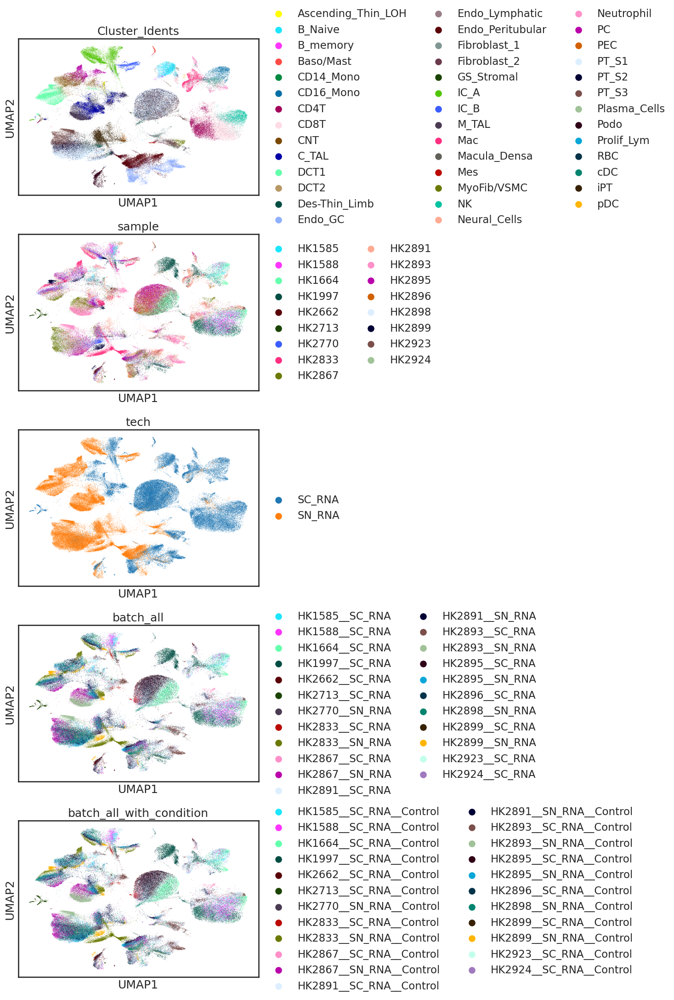

--------------------
Now evaluating Disease main effect


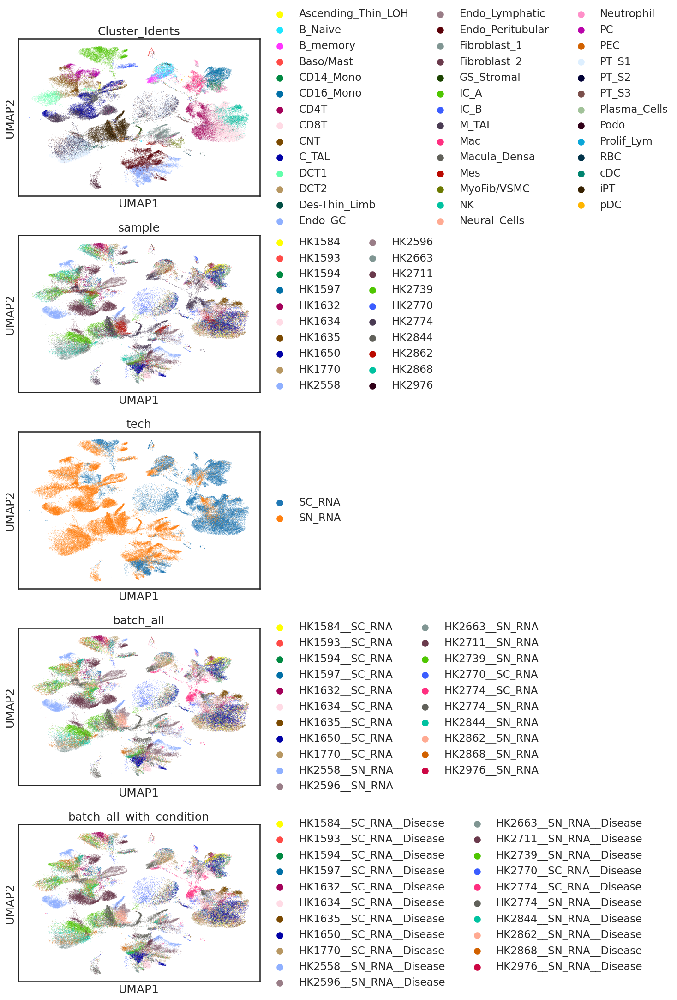

--------------------
Within each unique condition, plot denoised expression kidney_tech
Now evaluating Control denoised expression


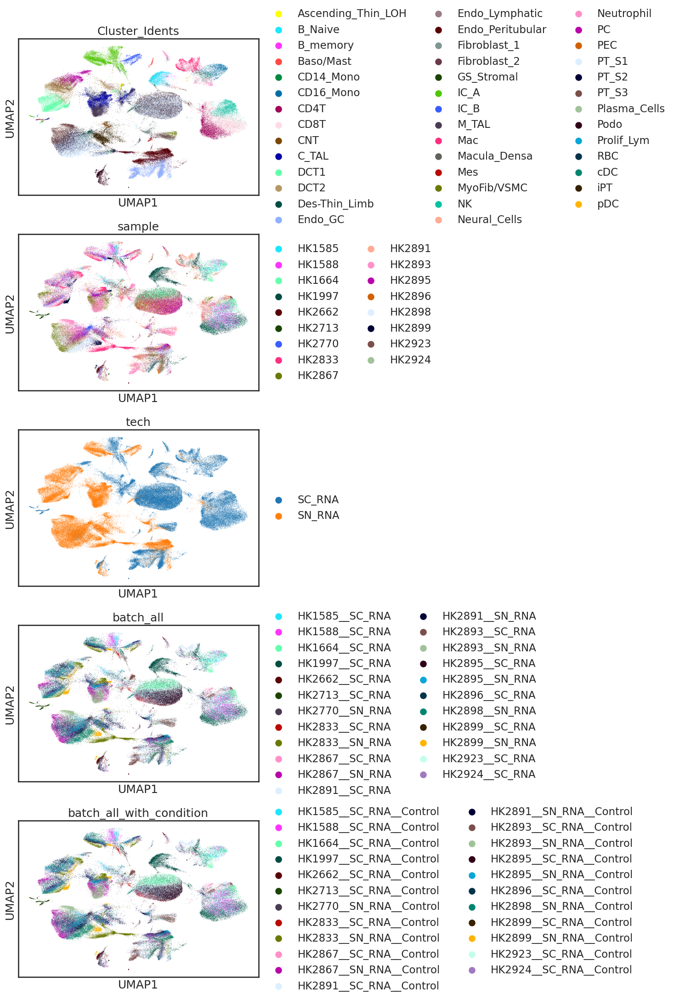

--------------------
Now evaluating Disease denoised expression


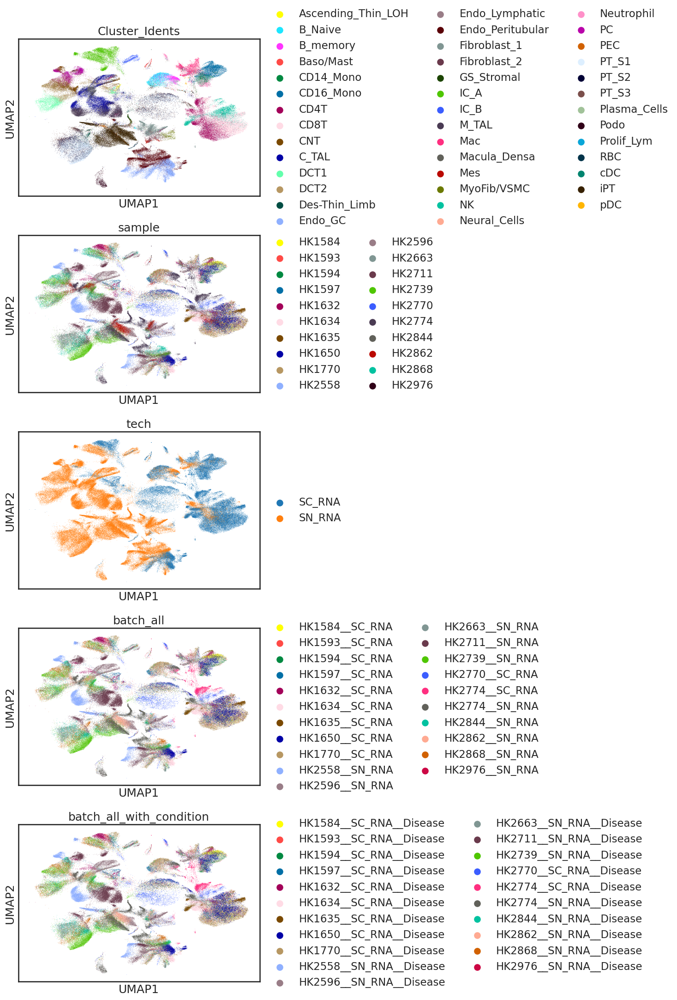

--------------------


In [9]:
adata=sc.read_h5ad("./cellanova/kidney_tech_results.h5ad")
plot_cellanova(adata=adata,cell_type_key='Cluster_Idents',batch_key=['sample','tech'],
                   condition_key="Status",dataset_name="kidney_tech")